In [4]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.layers import InputLayer,Dense,Conv2D,MaxPool2D,Flatten,Input,Layer,Dropout,RandomFlip,RandomRotation,Resizing,Rescaling,RandomContrast,RandomZoom,RandomTranslation,RandomBrightness
from  tensorflow.keras.models import Model,Sequential,load_model
from keras.src.layers.regularization.gaussian_noise import GaussianNoise
from tensorflow.keras.layers import BatchNormalization,Embedding,LayerNormalization,MultiHeadAttention
from tensorflow.keras.regularizers import L2,L1
import math
from tensorflow.keras.losses import CategoricalCrossentropy,SparseCategoricalCrossentropy
from tensorflow.keras.metrics import BinaryAccuracy,CategoricalAccuracy,TopKCategoricalAccuracy
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint,ReduceLROnPlateau,EarlyStopping
from tensorflow.keras.layers import GlobalAveragePooling2D,Add,Activation
from tensorflow.keras.utils import register_keras_serializable 
import tensorflow_probability as tfp


2025-07-07 12:58:56.611244: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1751893136.782496      35 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1751893136.830992      35 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [6]:
datasets="/kaggle/input/dataset12/totato_dataset"
CONFIGURATION={
        "BATCH_SIZE":32,
        "IMG_SIZE":256,
        "LEARNING_RATE": 0.001,
        "N_EPOCHS": 10,
        "DROPOUT_RATE": 0.2,
        "REGULARIZATION_RATE": 0.0001,
        "N_FILTERS": 7,
        "KERNEL_SIZE": 3,
        "N_STRIDES": 1,
        "POOL_SIZE": 2,
        "N_DENSE_1": 1024,
        "N_DENSE_2": 128,
        "NUM_CLASSES": 10,
        "PATCH_SIZE":16,
}
CLASS_NAME=['Tomato___Bacterial_spot',
 'Tomato___Early_blight',
 'Tomato___Late_blight',
 'Tomato___Leaf_Mold',
 'Tomato___Septoria_leaf_spot',
 'Tomato___Spider_mites Two-spotted_spider_mite',
 'Tomato___Target_Spot',
 'Tomato___Tomato_Yellow_Leaf_Curl_Virus',
 'Tomato___Tomato_mosaic_virus',
 'Tomato___healthy']

 # Remove the "Tomato___" prefix from all class names
RENAMED_CLASS_NAME = [name.replace("Tomato___", "") for name in CLASS_NAME]

print(RENAMED_CLASS_NAME)

['Bacterial_spot', 'Early_blight', 'Late_blight', 'Leaf_Mold', 'Septoria_leaf_spot', 'Spider_mites Two-spotted_spider_mite', 'Target_Spot', 'Tomato_Yellow_Leaf_Curl_Virus', 'Tomato_mosaic_virus', 'healthy']


In [7]:
dataset=tf.keras.preprocessing.image_dataset_from_directory(
    datasets,
    labels='inferred',#label
    label_mode='categorical',
    class_names=None,
    batch_size=CONFIGURATION["BATCH_SIZE"],
    image_size=(CONFIGURATION["IMG_SIZE"],CONFIGURATION["IMG_SIZE"]),
    shuffle=True,
    seed=None,
    verbose=True
)


Found 18160 files belonging to 10 classes.


I0000 00:00:1751893162.099944      35 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1751893162.100604      35 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


In [10]:
def splits(dataset,Train_ratio,Validation_ratio,Test_ratio):
    Dataset_size=len(dataset)

    train_dataset=dataset.take(int(Dataset_size*Train_ratio))


    val_test_dataset=dataset.skip(int(Dataset_size*Train_ratio))
    val_dataset=val_test_dataset.take(int(Dataset_size*Validation_ratio))

    test_dataset=val_test_dataset.skip(int(Dataset_size*Validation_ratio))

    return train_dataset,val_dataset,test_dataset

In [11]:
Train_ratio=0.6
Validation_ratio=0.2
Test_ratio=0.2


train_dataset,val_dataset,test_dataset=splits(dataset,Train_ratio,Validation_ratio,Test_ratio)
print(list(train_dataset.take(1).as_numpy_iterator()))
print(list(val_dataset.take(1).as_numpy_iterator()))
print(list(test_dataset.take(1).as_numpy_iterator()))

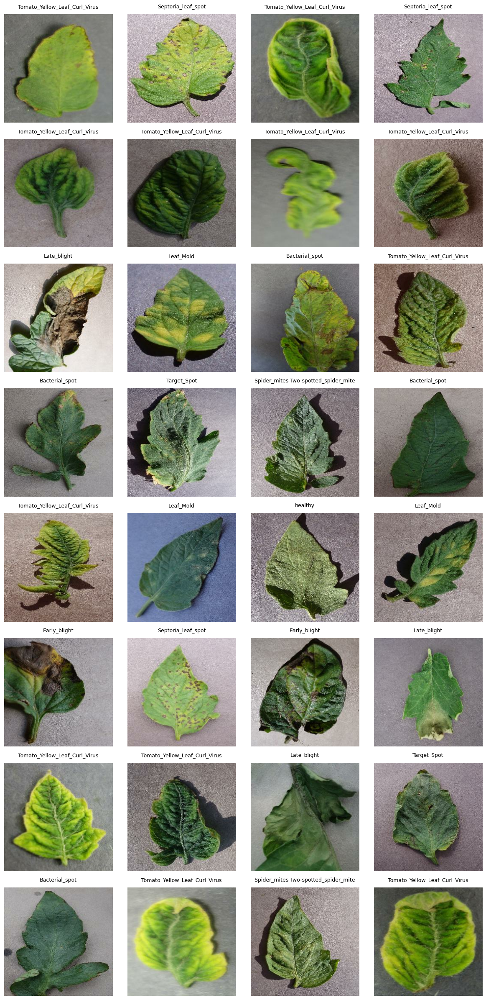

In [12]:

for batch_images, batch_labels in train_dataset.take(1):
    images = batch_images
    labels = batch_labels

# Number of images in the batch
n = len(images)
cols = 4
rows = math.ceil(n / cols)

plt.figure(figsize=(cols * 3, rows * 3))

for i in range(n):
    ax = plt.subplot(rows, cols, i + 1)
    plt.imshow(images[i].numpy() / 255.0)  # Normalize pixel values for display
    plt.axis("off")

    # Handle label format: one-hot or sparse
    if len(labels[i].shape) > 0 and labels[i].shape[0] > 1:
        class_index = tf.argmax(labels[i]).numpy()
    else:
        class_index = labels[i].numpy()

    # Use class name for title
    ax.set_title(RENAMED_CLASS_NAME[class_index], fontsize=9, pad=10)

plt.tight_layout()
plt.show()

In [14]:

augmentation_layers = Sequential([
    RandomFlip(mode="horizontal_and_vertical"),          # Flip both ways
    RandomRotation(factor=0.1),                          # Slightly increase rotation range
    RandomContrast(factor=0.4),                          # More contrast variation
    RandomZoom(height_factor=0.2, width_factor=0.2),     # Random zoom in/out
    RandomTranslation(height_factor=0.1, width_factor=0.1), # Translate image
    RandomBrightness(factor=0.2),                        # Brightness adjustment
    GaussianNoise(stddev=0.05),                          # Add slight noise
])

In [15]:
def augementation_layer(images,labels):
    return augmentation_layers(images,training=True),labels

In [16]:
def box(lambda_val):
    img_size = CONFIGURATION["IMG_SIZE"]
    
    # Sample random center position in the image
    center_x = tf.cast(tfp.distributions.Uniform(0, img_size).sample(), tf.int32)
    center_y = tf.cast(tfp.distributions.Uniform(0, img_size).sample(), tf.int32)

    # Compute width and height of the patch
    cut_ratio = tf.math.sqrt(1.0 - lambda_val)
    box_width = tf.cast(img_size * cut_ratio, tf.int32)
    box_height = tf.cast(img_size * cut_ratio, tf.int32)

    # Calculate top-left corner
    x1 = tf.clip_by_value(center_x - box_width // 2, 0, img_size)
    y1 = tf.clip_by_value(center_y - box_height // 2, 0, img_size)

    # Calculate bottom-right corner
    x2 = tf.clip_by_value(center_x + box_width // 2, 0, img_size)
    y2 = tf.clip_by_value(center_y + box_height // 2, 0, img_size)

    # Adjust width and height after clipping
    box_width = x2 - x1
    box_height = y2 - y1

    # Ensure non-zero box
    box_width = tf.maximum(box_width, 1)
    box_height = tf.maximum(box_height, 1)

    return y1, x1, box_height, box_width


In [17]:
def cutmix(image_label_1, image_label_2):
    image_1, label_1 = image_label_1
    image_2, label_2 = image_label_2

    lam = tfp.distributions.Beta(0.2, 0.2).sample()
    ry, rx, rh, rw = box(lam)

    # Crop patch from image 2 and pad it to same position in full image
    crop_2 = tf.image.crop_to_bounding_box(image_2, ry, rx, rh, rw)
    pad_2 = tf.image.pad_to_bounding_box(crop_2, ry, rx, CONFIGURATION["IMG_SIZE"], CONFIGURATION["IMG_SIZE"])

    # Cut same region from image 1 and subtract it
    crop_1 = tf.image.crop_to_bounding_box(image_1, ry, rx, rh, rw)
    pad_1 = tf.image.pad_to_bounding_box(crop_1, ry, rx, CONFIGURATION["IMG_SIZE"], CONFIGURATION["IMG_SIZE"])

    # Create final mixed image
    mixed_image = image_1 - pad_1 + pad_2

    # Adjust lambda to match the actual area used
    patch_area = tf.cast(rw * rh, tf.float32)
    total_area = tf.cast(CONFIGURATION["IMG_SIZE"] ** 2, tf.float32)
    adjusted_lam = 1.0 - (patch_area / total_area)

    # Mix labels
    mixed_label = adjusted_lam * tf.cast(label_1, tf.float32) + (1.0 - adjusted_lam) * tf.cast(label_2, tf.float32)

    return mixed_image, mixed_label


In [18]:
train_dataset_1=train_dataset.map(augementation_layer,num_parallel_calls=tf.data.AUTOTUNE)
train_dataset_2=train_dataset.map(augementation_layer,num_parallel_calls=tf.data.AUTOTUNE)

mixed_dataset=tf.data.Dataset.zip((train_dataset_1,train_dataset_2))

In [19]:
training_dataset=(mixed_dataset
.map(cutmix,num_parallel_calls=tf.data.AUTOTUNE)
.prefetch(tf.data.AUTOTUNE))

In [9]:
train_dataset=(
    train_dataset
    .map(augementation_layer,num_parallel_calls=tf.data.AUTOTUNE)
    .prefetch(buffer_size=tf.data.AUTOTUNE)
)


In [20]:
val_dataset=(
    val_dataset


    .prefetch(buffer_size=tf.data.AUTOTUNE)
)

In [21]:
test_dataset=(
    test_dataset


    .prefetch(buffer_size=tf.data.AUTOTUNE)
)

In [22]:
training_dataset

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 10), dtype=tf.float32, name=None))>

In [23]:
val_dataset

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 10), dtype=tf.float32, name=None))>

In [24]:
@register_keras_serializable()
class ResNet(Model):
    def __init__(self, **kwargs):
        super(ResNet, self).__init__(**kwargs)

        self.resize_rescale_layers = Sequential([
            Resizing(CONFIGURATION['IMG_SIZE'], CONFIGURATION['IMG_SIZE']),
            Rescaling(1. / 255)
        ])

        self.conv = CustomConv2D(64, 7, 2, padding='same')
        self.max_pool = MaxPool2D(3, 2)

        self.conv_2_1 = ResidualBlock(64)
        self.conv_2_2 = ResidualBlock(64)
        self.conv_2_3 = ResidualBlock(64)

        self.conv_3_1 = ResidualBlock(128, 2)
        self.conv_3_2 = ResidualBlock(128)
        self.conv_3_3 = ResidualBlock(128)
        self.conv_3_4 = ResidualBlock(128)

        self.conv_4_1 = ResidualBlock(256, 2)
        self.conv_4_2 = ResidualBlock(256)
        self.conv_4_3 = ResidualBlock(256)
        self.conv_4_4 = ResidualBlock(256)
        self.conv_4_5 = ResidualBlock(256)
        self.conv_4_6 = ResidualBlock(256)

        self.conv_5_1 = ResidualBlock(512, 2)
        self.conv_5_2 = ResidualBlock(512)
        self.conv_5_3 = ResidualBlock(512)

        self.global_pool = GlobalAveragePooling2D()
        self.fc_3 = Dense(CONFIGURATION["NUM_CLASSES"], activation='softmax')

    def call(self, x, training=True):
        x = self.resize_rescale_layers(x)

        x = self.conv(x)
        x = self.max_pool(x)

        x = self.conv_2_1(x, training=training)
        x = self.conv_2_2(x, training=training)
        x = self.conv_2_3(x, training=training)

        x = self.conv_3_1(x, training=training)
        x = self.conv_3_2(x, training=training)
        x = self.conv_3_3(x, training=training)
        x = self.conv_3_4(x, training=training)

        x = self.conv_4_1(x, training=training)
        x = self.conv_4_2(x, training=training)
        x = self.conv_4_3(x, training=training)
        x = self.conv_4_4(x, training=training)
        x = self.conv_4_5(x, training=training)
        x = self.conv_4_6(x, training=training)

        x = self.conv_5_1(x, training=training)
        x = self.conv_5_2(x, training=training)
        x = self.conv_5_3(x, training=training)

        x = self.global_pool(x)
        return self.fc_3(x)

In [25]:
@register_keras_serializable()
class CustomConv2D(Layer):
  def __init__(self,n_filters,kernel_size,strides,padding='valid'):
    super(CustomConv2D,self).__init__(name='custom_conv_2d')

    self.conv=Conv2D(filters=n_filters,kernel_size=kernel_size,activation='relu',strides=strides,padding=padding)
    self.batch_norm=BatchNormalization()

  def call(self,x,training=True):
    x=self.conv(x)
    x=self.batch_norm(x,training=training)
    return x

In [26]:
@register_keras_serializable()
class ResidualBlock(Layer):
  def __init__(self,n_channels,strides=1):
    super(ResidualBlock,self).__init__(name='res_block')

    self.dotted=(strides!=1)#

    self.custom_conv_1=CustomConv2D(n_channels,3,strides,padding='same')
    self.custom_conv_2=CustomConv2D(n_channels,3,1,padding='same')

    self.activation=Activation('relu')

    if self.dotted:
      self.custom_conv_3=CustomConv2D(n_channels,1,strides)

  def call(self,input,training=True):
    x=self.custom_conv_1(input,training=training)
    x=self.custom_conv_2(x,training=training)

    if self.dotted:
      x_add=self.custom_conv_3(input,training=training)
      x_add=Add()([x,x_add])
    else:
      x_add=Add()([x,input])
    x=self.activation(x)

    return self.activation(x_add)

In [27]:
resnet_34=ResNet()
resnet_34(tf.zeros([1,256,256,3]),training=False)
resnet_34.summary()

I0000 00:00:1751893246.960032      35 cuda_dnn.cc:529] Loaded cuDNN version 90300


Model: "res_net"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ sequential_2 (Sequential)            │ (1, 256, 256, 3)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ custom_conv_2d (CustomConv2D)        │ ?                           │           9,728 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ ?                           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ res_block (ResidualBlock)            │ ?                           │          74,368 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ res_block (ResidualBlock)            │ ?                           │          74,368 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ res_block (ResidualBlock)            │ ?                           │          74,368 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ res_block (ResidualBlock)            │ ?                           │         231,296 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ res_block (ResidualBlock)            │ ?                           │         296,192 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ res_block (ResidualBlock)            │ ?                           │         296,192 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ res_block (ResidualBlock)            │ ?                           │         296,192 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ res_block (ResidualBlock)            │ ?                           │         921,344 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ res_block (ResidualBlock)            │ ?                           │       1,182,208 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ res_block (ResidualBlock)            │ ?                           │       1,182,208 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ res_block (ResidualBlock)            │ ?                           │       1,182,208 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ res_block (ResidualBlock)            │ ?                           │       1,182,208 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ res_block (ResidualBlock)            │ ?                           │       1,182,208 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ res_block (ResidualBlock)            │ ?                           │       3,677,696 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ res_block (ResidualBlock)            │ ?                           │       4,723,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ res_block (ResidualBlock)            │ ?                           │       4,723,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ ?                           │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (1, 10)                     │           5,1

 Total params: 21,315,338 (81.31 MB)

 Trainable params: 21,298,314 (81.25 MB)

 Non-trainable params: 17,024 (66.50 KB)

In [37]:
pleteau_callback=ReduceLROnPlateau(
    monitor='val_accuracy',
    factor=0.1,
    patience=2,
    min_lr=1e-6,
    verbose=0,
    mode='auto',
    min_delta=0.0001,
    cooldown=0,
    
)

In [38]:
es_callback=EarlyStopping(
    monitor='val_loss',
    min_delta=0,
    patience=5,
    verbose=1,
    mode='auto',
    baseline=None,
    restore_best_weights=True
)

In [39]:
checkpoint_callback = ModelCheckpoint(
    'best_model.keras',         # ✅ Full model: architecture + weights
    monitor='val_accuracy',
    mode='max',
    verbose=1,
    save_best_only=True         # Only saves the best model on validation accuracy
)

In [40]:
loss_function= CategoricalCrossentropy(from_logits=False)#from_logit=Ture makes the output sum to one but as softmax is there we dont need to do so
# loss_function=SparseCategoricalCrossentropy()


In [42]:
metrics=[CategoricalAccuracy(name="accuracy")]


In [43]:

resnet_34.compile(
    optimizer=Adam(learning_rate=CONFIGURATION["LEARNING_RATE"]),
    loss=loss_function,
    metrics=metrics
)

In [44]:
history=resnet_34.fit(
    training_dataset,
    validation_data=val_dataset,
    epochs=CONFIGURATION["N_EPOCHS"]*3,
    verbose=1,
    callbacks=[pleteau_callback,es_callback,checkpoint_callback]
)

Epoch 1/30
340/340 ━━━━━━━━━━━━━━━━━━━━ 0s 695ms/step - accuracy: 0.6357 - loss: 1.2505
Epoch 1: val_accuracy improved from -inf to 0.20686, saving model to best_model.keras
340/340 ━━━━━━━━━━━━━━━━━━━━ 301s 747ms/step - accuracy: 0.6357 - loss: 1.2503 - val_accuracy: 0.2069 - val_loss: 2.9373 - learning_rate: 0.0010
Epoch 2/30
340/340 ━━━━━━━━━━━━━━━━━━━━ 0s 697ms/step - accuracy: 0.7121 - loss: 1.1031
Epoch 2: val_accuracy improved from 0.20686 to 0.66316, saving model to best_model.keras
340/340 ━━━━━━━━━━━━━━━━━━━━ 255s 740ms/step - accuracy: 0.7121 - loss: 1.1030 - val_accuracy: 0.6632 - val_loss: 1.1336 - learning_rate: 0.0010
Epoch 3/30
340/340 ━━━━━━━━━━━━━━━━━━━━ 0s 692ms/step - accuracy: 0.7621 - loss: 0.9604
Epoch 3: val_accuracy improved from 0.66316 to 0.79259, saving model to best_model.keras
340/340 ━━━━━━━━━━━━━━━━━━━━ 253s 735ms/step - accuracy: 0.7621 - loss: 0.9603 - val_accuracy: 0.7926 - val_loss: 0.6234 - learning_rate: 0.0010
Epoch 4/30
340/340 ━━━━━━━━━━━━━━━━━━

In [ ]:

# Step 1: Create model
resnet_34 = ResNet()

# Step 2: Force initialization
_ = resnet_34(tf.zeros([1, 256, 256, 3]))

# Step 3: Load trained weights (must match architecture exactly)
resnet_34.load_weights("best_model.keras")

# Step 4: Run a dummy inference AGAIN after loading weights
# This ensures all layers like BatchNorm restore their moving stats
_ = resnet_34(tf.zeros([1, 256, 256, 3]), training=False)

# Step 5: Define serving function
@tf.function(input_signature=[tf.TensorSpec([None, 256, 256, 3], tf.float32)])
def serve_fn(x):
    return {"predictions": resnet_34(x, training=False)}

# Step 6: Export model
tf.saved_model.save(
    resnet_34,
    "saved_model",  # Replace with actual path
    signatures={"serving_default": serve_fn}
)


In [45]:

import shutil

# 1. Create & initialize
resnet_34 = ResNet()
_ = resnet_34(tf.zeros([1, 256, 256, 3]))

# 2. Load weights
resnet_34.load_weights("best_model.keras")

# 3. Compile & evaluate
resnet_34.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
loss, acc = resnet_34.evaluate(test_dataset)
print(f"Test accuracy: {acc}, Loss: {loss}")

# 4. Initialize all variables
for _ in range(5):  # Process 5 batches
    for x, _ in test_dataset.take(1):
        _ = resnet_34(x, training=False)
_ = resnet_34(tf.random.normal([1, 256, 256, 3]), training=False)

# 5. Define serving signature
@tf.function(input_signature=[tf.TensorSpec([None, 256, 256, 3], tf.float32)])
def serve_fn(x):
    return {"predictions": resnet_34(x, training=False)}

# 6. Trace serving function and save model
input_shapes = [
    tf.zeros([1, 256, 256, 3]),
    tf.random.normal([1, 256, 256, 3]),
    tf.ones([1, 256, 256, 3])
]
for input_tensor in input_shapes:
    _ = serve_fn(input_tensor)
shutil.rmtree("saved_model", ignore_errors=True)
tf.saved_model.save(resnet_34, "saved_model", signatures={"serving_default": serve_fn})

# 7. Zip the saved model
shutil.make_archive("/kaggle/working/saved_model", 'zip', "/kaggle/working/saved_model")

115/115 ━━━━━━━━━━━━━━━━━━━━ 22s 94ms/step - accuracy: 0.9483 - loss: 0.1970
Test accuracy: 0.9495087265968323, Loss: 0.1933632493019104


'/kaggle/working/saved_model.zip'

In [28]:
@tf.function(input_signature=[tf.TensorSpec([None, 256, 256, 3], tf.float32)])
def serve_fn(x):
    return {"predictions": resnet_34(x, training=False)}


In [29]:
tf.saved_model.save(resnet_34, "saved_model", signatures={"serving_default": serve_fn})





first image to predict
actual label: Tomato___Spider_mites Two-spotted_spider_mite
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
predicted label: Tomato___Spider_mites Two-spotted_spider_mite


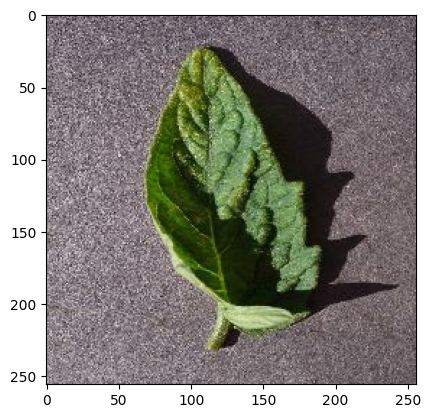

In [30]:
for batch_images, batch_labels in test_dataset.take(1):
    first_image=batch_images[0].numpy().astype('uint8')
    first_label=batch_labels[0].numpy()
    print("first image to predict")
    plt.imshow(first_image)
    # print("actual label:",np.argmax(first_label))
    print("actual label:",CLASS_NAME[np.argmax(first_label)])

    batch_prediction=resnet_34.predict(batch_images)
    print("predicted label:",CLASS_NAME[np.argmax(batch_prediction[0])])

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
Predicted label: Tomato___Leaf_Mold


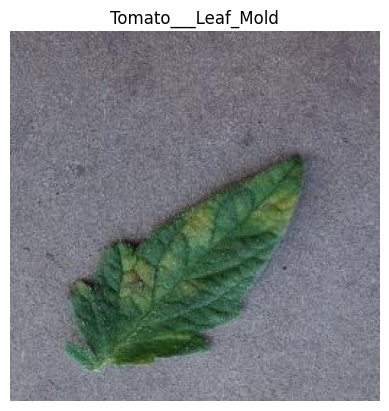

In [31]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

img_path = "/kaggle/input/dataset12/totato_dataset/Tomato___Leaf_Mold/00694db7-3327-45e0-b4da-a8bb7ab6a4b7___Crnl_L.Mold 6923.JPG"
img = Image.open(img_path).convert("RGB")

img_array = np.array(img).astype('float32')  # NO / 255 scaling here
img_array = np.expand_dims(img_array, axis=0)

prediction = resnet_34.predict(img_array)
predicted_label = CLASS_NAME[np.argmax(prediction[0])]

print("Predicted label:", predicted_label)

plt.imshow(img)
plt.title(predicted_label)
plt.axis('off')
plt.show()



1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
Predicted label: Tomato___Bacterial_spot


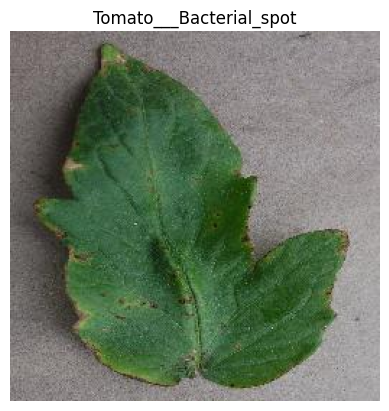

In [32]:
from tensorflow.keras.models import load_model
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# Make sure your custom layers and model are registered if you used @register_keras_serializable
# Or pass them in custom_objects if not registered globally

# Load the saved model
loaded_model = load_model("/kaggle/input/model/tensorflow2/default/1/model.keras")

# Image path and constants
img_path = "/kaggle/input/dataset12/totato_dataset/Tomato___Bacterial_spot/0045ba29-ed1b-43b4-afde-719cc7adefdb___GCREC_Bact.Sp 6254.JPG"
IMG_SIZE = 256  # or whatever you used
CLASS_NAME = [
    'Tomato___Bacterial_spot',
    'Tomato___Early_blight',
    'Tomato___Late_blight',
    'Tomato___Leaf_Mold',
    'Tomato___Septoria_leaf_spot',
    'Tomato___Spider_mites Two-spotted_spider_mite',
    'Tomato___Target_Spot',
    'Tomato___Tomato_Yellow_Leaf_Curl_Virus',
    'Tomato___Tomato_mosaic_virus',
    'Tomato___healthy'
]

# Load and preprocess image
img = Image.open(img_path).convert("RGB")
img = img.resize((IMG_SIZE, IMG_SIZE))  # optional

img_array = np.array(img).astype('float32')  # No scaling, if model expects unscaled
img_array = np.expand_dims(img_array, axis=0)

# Predict with loaded model
prediction = loaded_model.predict(img_array)
predicted_label = CLASS_NAME[np.argmax(prediction[0])]

print("Predicted label:", predicted_label)

# Display the image with title
plt.imshow(img)
plt.title(predicted_label)
plt.axis('off')
plt.show()


Predicted: Tomato___Septoria_leaf_spot


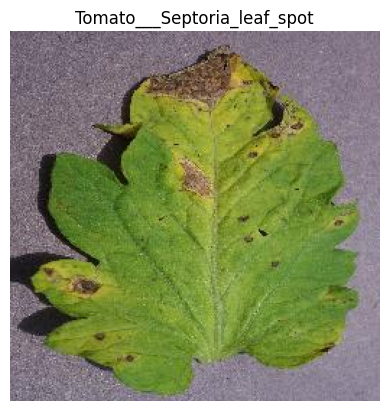

In [47]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from keras.layers import TFSMLayer

# Load SavedModel folder using TFSMLayer
loaded_model = TFSMLayer("/kaggle/working/saved_model", call_endpoint="serving_default")

# Preprocess image to match input signature (only resizing, no scaling)
img = Image.open("/kaggle/input/dataset12/totato_dataset/Tomato___Septoria_leaf_spot/0025c401-7785-49c5-8bef-780a8a0d3652___Matt.S_CG 2694.JPG").convert("RGB")
img = img.resize((256, 256))
img_array = np.array(img).astype('float32')  # No manual scaling
img_array = np.expand_dims(img_array, axis=0)

# Prediction
result = loaded_model(img_array, training=False)
pred = list(result.values())[0].numpy()[0]

# Output label
class_names = [
    'Tomato___Bacterial_spot',
    'Tomato___Early_blight',
    'Tomato___Late_blight',
    'Tomato___Leaf_Mold',
    'Tomato___Septoria_leaf_spot',
    'Tomato___Spider_mites Two-spotted_spider_mite',
    'Tomato___Target_Spot',
    'Tomato___Tomato_Yellow_Leaf_Curl_Virus',
    'Tomato___Tomato_mosaic_virus',
    'Tomato___healthy'
]

print("Predicted:", class_names[np.argmax(pred)])

# Show the image
plt.imshow(img)
plt.title(class_names[np.argmax(pred)])
plt.axis('off')
plt.show()



In [34]:
import shutil

# Compress the folder into a zip file
shutil.make_archive('/kaggle/working/saved_model', 'zip', '/kaggle/working/saved_model')


'/kaggle/working/saved_model.zip'

In [16]:
import tensorflow as tf
import shutil
from tensorflow.keras.layers import InputLayer, Dense, Conv2D, MaxPool2D, Flatten, Input, Layer, Dropout, RandomFlip, RandomRotation, Resizing, Rescaling, RandomContrast
from tensorflow.keras.models import Model, Sequential, load_model
from tensorflow.keras.layers import GlobalAveragePooling2D, Add, Activation
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.utils import register_keras_serializable

CONFIGURATION = {
    "BATCH_SIZE": 32,
    "IMG_SIZE": 256,
    "LEARNING_RATE": 0.001,
    "N_EPOCHS": 10,
    "DROPOUT_RATE": 0.2,
    "REGULARIZATION_RATE": 0.0001,
    "N_FILTERS": 7,
    "KERNEL_SIZE": 3,
    "N_STRIDES": 1,
    "POOL_SIZE": 2,
    "N_DENSE_1": 1024,
    "N_DENSE_2": 128,
    "NUM_CLASSES": 10,
    "PATCH_SIZE": 16,
}

@register_keras_serializable()
class CustomConv2D(Layer):
    def __init__(self, n_filters, kernel_size, strides, padding='valid', name=None):
        super(CustomConv2D, self).__init__(name=name or 'custom_conv_2d')
        self.conv = Conv2D(filters=n_filters, kernel_size=kernel_size, activation='relu', strides=strides, padding=padding, name='conv2d')
        self.batch_norm = BatchNormalization(name='batch_normalization')

    def call(self, x, training=True):
        x = self.conv(x)
        x = self.batch_norm(x, training=training)
        return x

@register_keras_serializable()
class ResidualBlock(Layer):
    def __init__(self, n_channels, strides=1, name=None):
        super(ResidualBlock, self).__init__(name=name or 'res_block')
        self.dotted = (strides != 1)
        self.custom_conv_1 = CustomConv2D(n_channels, 3, strides, padding='same', name='custom_conv_1')
        self.custom_conv_2 = CustomConv2D(n_channels, 3, 1, padding='same', name='custom_conv_2')
        self.activation = Activation('relu', name='activation')
        if self.dotted:
            self.custom_conv_3 = CustomConv2D(n_channels, 1, strides, name='custom_conv_3')

    def call(self, input, training=True):
        x = self.custom_conv_1(input, training=training)
        x = self.custom_conv_2(x, training=training)
        if self.dotted:
            x_add = self.custom_conv_3(input, training=training)
            x_add = Add(name='add')([x, x_add])
        else:
            x_add = Add(name='add')([x, input])
        return self.activation(x_add)

@register_keras_serializable()
class ResNet(Model):
    def __init__(self, **kwargs):
        super(ResNet, self).__init__(name='res_net')
        self.resize_rescale_layers = Sequential([
            Resizing(CONFIGURATION['IMG_SIZE'], CONFIGURATION['IMG_SIZE'], name='resizing'),
            Rescaling(1. / 255, name='rescaling')
        ])
        self.conv = CustomConv2D(64, 7, 2, padding='same', name='initial_conv')
        self.max_pool = MaxPool2D(3, 2, name='max_pool')
        self.conv_2_1 = ResidualBlock(64, name='conv_2_1')
        self.conv_2_2 = ResidualBlock(64, name='conv_2_2')
        self.conv_2_3 = ResidualBlock(64, name='conv_2_3')
        self.conv_3_1 = ResidualBlock(128, 2, name='conv_3_1')
        self.conv_3_2 = ResidualBlock(128, name='conv_3_2')
        self.conv_3_3 = ResidualBlock(128, name='conv_3_3')
        self.conv_3_4 = ResidualBlock(128, name='conv_3_4')
        self.conv_4_1 = ResidualBlock(256, 2, name='conv_4_1')
        self.conv_4_2 = ResidualBlock(256, name='conv_4_2')
        self.conv_4_3 = ResidualBlock(256, name='conv_4_3')
        self.conv_4_4 = ResidualBlock(256, name='conv_4_4')
        self.conv_4_5 = ResidualBlock(256, name='conv_4_5')
        self.conv_4_6 = ResidualBlock(256, name='conv_4_6')
        self.conv_5_1 = ResidualBlock(512, 2, name='conv_5_1')
        self.conv_5_2 = ResidualBlock(512, name='conv_5_2')
        self.conv_5_3 = ResidualBlock(512, name='conv_5_3')
        self.global_pool = GlobalAveragePooling2D(name='global_pool')
        self.fc_3 = Dense(CONFIGURATION["NUM_CLASSES"], activation='softmax', name='fc_3')

    def call(self, x, training=True):
        x = self.resize_rescale_layers(x)
        x = self.conv(x)
        x = self.max_pool(x)
        x = self.conv_2_1(x, training=training)
        x = self.conv_2_2(x, training=training)
        x = self.conv_2_3(x, training=training)
        x = self.conv_3_1(x, training=training)
        x = self.conv_3_2(x, training=training)
        x = self.conv_3_3(x, training=training)
        x = self.conv_3_4(x, training=training)
        x = self.conv_4_1(x, training=training)
        x = self.conv_4_2(x, training=training)
        x = self.conv_4_3(x, training=training)
        x = self.conv_4_4(x, training=training)
        x = self.conv_4_5(x, training=training)
        x = self.conv_4_6(x, training=training)
        x = self.conv_5_1(x, training=training)
        x = self.conv_5_2(x, training=training)
        x = self.conv_5_3(x, training=training)
        x = self.global_pool(x)
        return self.fc_3(x)

# 1. Create & initialize
resnet_34 = load_model("/kaggle/input/model1/tensorflow2/default/1/best_model (2).keras")
_ = resnet_34(tf.zeros([1, 256, 256, 3]))

# 2. Compile & evaluate
resnet_34.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
loss, acc = resnet_34.evaluate(test_dataset)
print(f"Test accuracy: {acc}, Loss: {loss}")

# 3. Initialize all variables
for _ in range(50):  # Process 50 batches
    for x, _ in test_dataset.take(1):
        _ = resnet_34(x, training=False)
_ = resnet_34(tf.random.normal([1, 256, 256, 3]), training=False)
_ = resnet_34(tf.ones([1, 256, 256, 3]), training=False)
_ = resnet_34(tf.zeros([1, 256, 256, 3]), training=False)
_ = resnet_34(tf.random.uniform([1, 256, 256, 3], minval=-1, maxval=1), training=False)
_ = resnet_34(tf.random.uniform([1, 256, 256, 3], minval=0, maxval=1), training=False)

# 4. Define serving signature
@tf.function(input_signature=[tf.TensorSpec([None, 256, 256, 3], tf.float32)])
def serve_fn(x):
    return {"predictions": resnet_34(x, training=False)}

# 5. Trace serving function and save model
input_shapes = [
    tf.zeros([1, 256, 256, 3]),
    tf.ones([1, 256, 256, 3]),
    tf.random.normal([1, 256, 256, 3]),
    tf.random.uniform([1, 256, 256, 3], minval=-1, maxval=1),
    tf.random.uniform([1, 256, 256, 3], minval=0, maxval=1),
    tf.random.uniform([2, 256, 256, 3], minval=0, maxval=1)
]
for input_tensor in input_shapes:
    _ = serve_fn(input_tensor)
shutil.rmtree("saved_model", ignore_errors=True)
tf.saved_model.save(resnet_34, "saved_model", signatures={"serving_default": serve_fn})

# 6. Zip the saved model
shutil.make_archive("saved_model", 'zip', "saved_model")

# 7. Test the saved model locally
saved_model = tf.saved_model.load("saved_model")
result = saved_model.serve(tf.random.uniform([1, 256, 256, 3], minval=0, maxval=1))
print(result["predictions"])

115/115 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - accuracy: 0.9682 - loss: 0.1035
Test accuracy: 0.9677947759628296, Loss: 0.10060092806816101


AttributeError: '_UserObject' object has no attribute 'serve'

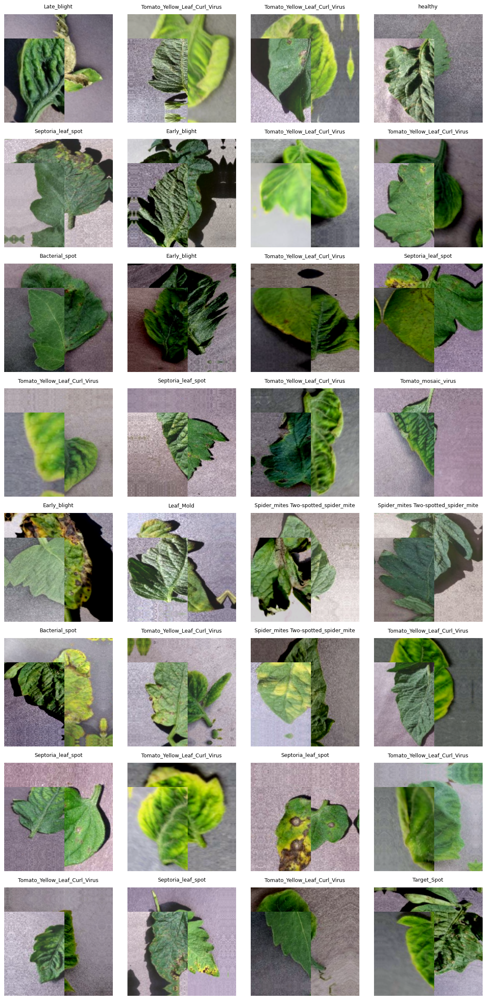

In [46]:
for batch_images, batch_labels in training_dataset.take(1):
    images = batch_images
    labels = batch_labels

# Number of images in the batch
n = len(images)
cols = 4
rows = math.ceil(n / cols)

plt.figure(figsize=(cols * 3, rows * 3))

for i in range(n):
    ax = plt.subplot(rows, cols, i + 1)
    plt.imshow(images[i].numpy() / 255.0)  # Normalize pixel values for display
    plt.axis("off")

    # Handle label format: one-hot or sparse
    if len(labels[i].shape) > 0 and labels[i].shape[0] > 1:
        class_index = tf.argmax(labels[i]).numpy()
    else:
        class_index = labels[i].numpy()

 # Use class name for title
    ax.set_title(RENAMED_CLASS_NAME[class_index], fontsize=9, pad=10)

plt.tight_layout()
plt.show()